In [1]:
%load_ext autoreload
%autoreload 2
%config InlineBackend.figure_format = 'retina'

In [2]:
from fpipe.pipeline.pipeline import run_pipeline
from fpipe.timestream import data_base as db 
from fpipe.timestream import bandpass_cal
from fpipe.timestream import destripe
from fpipe.timestream import rm_baseline
from fpipe.fnoise import fnoise

from fpipe.plot import plot_bandpass
from fpipe.plot import plot_waterfall
from fpipe.plot import plot_cal

import numpy as np
import os

from collections import OrderedDict as dict
from fpipe.point_source import abs_cal
from astropy.coordinates.angles import Angle

data_base = '/home/ycli/data/fanalysis/'
band_list = ['_1050-1150MHz', '_1150-1250MHz', '_1250-1450MHz']
tnoise_file= '/home/ycli/data/fast/tnoise/Tnoise_M_low.h5'
fwhm_file = '/home/ycli/code/fpipe/fpipe/data/fwhm.dat'
beam_list = [[16, 17, 18], [6, 7, 15, 19], [1, 2, 5, 8, 14], [3, 4, 9, 13], [10, 11, 12]]

In [3]:
@run_pipeline
def gt_cal():
    
    pipe_tasks = []
    pipe_outdir = data_base
    pipe_logging = 'info'
    pipe_copy = False
    pipe_feedback = 0
    pipe_timing = True
    
    feed_select = list(np.arange(1, 20))
    

    pipe_tasks.append((destripe.TimeVar_Cal, 'gtcal1_'))
    pipe_tasks.append((bandpass_cal.Apply_EtaA, 'etaA1_'))
    
    #gtcal1_input_files  = ['sir_flagging_sumfeeds/%s_1050-1150MHz.h5'%f for f in file_list]
    gtcal1_input_files  = [] #['rb4_sumfeeds_nocal/%s_1050-1150MHz.h5'%f for f in file_list]
    gtcal1_output_files = [] #['gtcal_sumfeeds/%s_1050-1150MHz.h5'%f for f in file_list]
    gtcal1_gt_file = '' #data_base + '/gtgnu/%s_NoInterp.h5'%suffix
    gtcal1_ps_file = '' #data_base + '/gtps/%s.h5'%(suffix)
    
    etaA1_input_files  = [] #gtcal1_output_files
    etaA1_output_files = [] #['etaA_sumfeeds/%s_1050-1150MHz.h5'%f for f in file_list]
    etaA1_eta_A = [] #eta_A

    return locals()

@run_pipeline
def rm_bl():
    
    pipe_tasks = []
    pipe_outdir = data_base
    pipe_logging = 'info'
    pipe_copy = False
    pipe_feedback = 0
    pipe_timing = True
    
    feed_select = list(np.arange(1, 20))
    
    pipe_tasks.append((rm_baseline.Remove_Baseline, 'rmbsl1_'))
    rmbsl1_input_files  = [] #etaA1_output_files
    rmbsl1_output_files = [] #['rmbsl_sumfeeds/%s_1050-1150MHz.h5'%f for f in file_list]
    rmbsl1_baseline_file = '' #data_base + '/baseline/%s_%s.h5'%(DATA, DATE)

    return locals()


In [4]:
DATA_Key_list = [#'20210313', '20210314', '20210305', '20210302', '20210306', '20210307', '20210309', 
                 '20220210', '20220211', '20220212', '20220213', '20220214', '20220222',
                 '20220215', '20220216', '20220217', '20220218', '20220219', '20220220',
                ]

#DATA_Key_list = ['20210313',]

def iter_data_key(DATA_Key_list):
    
    for DATA_Key in DATA_Key_list:
    
        data = db.DATA_BASE[DATA_Key]
        DATA = data['DATA']
        DATE = data['DATE']
        cal_date = data['DATE_CAL']
        
        yield DATA_Key, DATA, DATE, cal_date

In [5]:
%reset -f array

In [ ]:
for DATA_Key, DATA, DATE, cal_date in iter_data_key(DATA_Key_list):

    data_path = data_base + '/raw/calibration/%s/'%cal_date
    output_path = data_base + '/cal_3c286/'
    if not os.path.exists(output_path + '%s'%cal_date):
        os.makedirs(output_path + '%s'%cal_date)
    
    cal_keys = []
    for data_name in os.listdir(data_path):
        cal_ra  = Angle('13h31m08.287984s')
        cal_dec = Angle('30d30m32.958850s')
        cal_model = abs_cal.cal_3C286()
        off = 12.0/60.
        on  =  3./60.
        _name = data_name.split('.')[0]
        _name = _name.split('_')
        suffix = '%s_%s_%s'%(_name[0], _name[1], _name[-1])
        output = output_path + '%s/%s'%(cal_date, suffix)
        cal_keys.append('%s_%s'%(_name[0], _name[1]))
        print(output)
        abs_cal.cali(data_path, data_name, cal_ra, cal_dec, cal_model, 
                     off_threshold=off, on_threshold=on, output=output,
                     plot=False)
    cal_keys = list(set(cal_keys))
    cal_keys.sort()
    
    eta_path = data_base + '/eta/'
    key_dict = {}
    key_dict[cal_date] = cal_keys
    abs_cal.output_fit_eta(output_path, key_dict, eta_path, beam_list,
            band_list=band_list, tnoise_model=tnoise_file)

/home/ycli/data/fanalysis//cal_3c286/20220210/3C286_005_1050-1150MHz
Beam 10 Freq 1050.01 - 1149.99


/home/opt/python/anaconda3.8_parallelhdf5/lib/python3.8/site-packages/numpy/core/fromnumeric.py:753: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Beam 11 Freq 1050.01 - 1149.99
Beam 12 Freq 1050.01 - 1149.99
/home/ycli/data/fanalysis//cal_3c286/20220210/3C286_003_1050-1150MHz
Beam 01 Freq 1050.01 - 1149.99
Beam 02 Freq 1050.01 - 1149.99
Beam 05 Freq 1050.01 - 1149.99
Beam 08 Freq 1050.01 - 1149.99
Beam 14 Freq 1050.01 - 1149.99
/home/ycli/data/fanalysis//cal_3c286/20220210/3C286_002_1150-1250MHz
Beam 06 Freq 1150.01 - 1249.99
Beam 07 Freq 1150.01 - 1249.99
Beam 15 Freq 1150.01 - 1249.99
Beam 19 Freq 1150.01 - 1249.99
/home/ycli/data/fanalysis//cal_3c286/20220210/3C286_001_1250-1450MHz
Beam 16 Freq 1250.00 - 1449.99
Beam 17 Freq 1250.00 - 1449.99
Beam 18 Freq 1250.00 - 1449.99
/home/ycli/data/fanalysis//cal_3c286/20220210/3C286_001_1050-1150MHz
Beam 16 Freq 1050.01 - 1149.99
Beam 17 Freq 1050.01 - 1149.99
Beam 18 Freq 1050.01 - 1149.99
/home/ycli/data/fanalysis//cal_3c286/20220210/3C286_003_1250-1450MHz
Beam 01 Freq 1250.00 - 1449.99
Beam 02 Freq 1250.00 - 1449.99
Beam 05 Freq 1250.00 - 1449.99
Beam 08 Freq 1250.00 - 1449.99
Beam

In [8]:
output_path = data_base + '/cal_3c286/'
key_dict = {}
for DATA_Key, DATA, DATE, cal_date in iter_data_key(DATA_Key_list[:6]):
    
    data_path = data_base + '/raw/calibration/%s/'%cal_date
    cal_keys = []
    for data_name in os.listdir(data_path):
        _name = data_name.split('.')[0]
        _name = _name.split('_')
        cal_keys.append('%s_%s'%(_name[0], _name[1]))
    cal_keys = list(set(cal_keys))
    cal_keys.sort()
    key_dict[cal_date] = cal_keys
print(key_dict)

{'20220210': ['3C286_001', '3C286_002', '3C286_003', '3C286_004', '3C286_005'], '20220211': ['3C286_006', '3C286_007', '3C286_008', '3C286_009', '3C286_010'], '20220212': ['3C286_011', '3C286_012', '3C286_013', '3C286_014', '3C286_015'], '20220213': ['3C286_016', '3C286_017', '3C286_018', '3C286_019', '3C286_020'], '20220214': ['3C286_021', '3C286_022', '3C286_023', '3C286_024', '3C286_025'], '20220223': ['3C286_036', '3C286_037', '3C286_038', '3C286_039', '3C286_040']}


findfont: Font family ['serif'] not found. Falling back to DejaVu Sans.


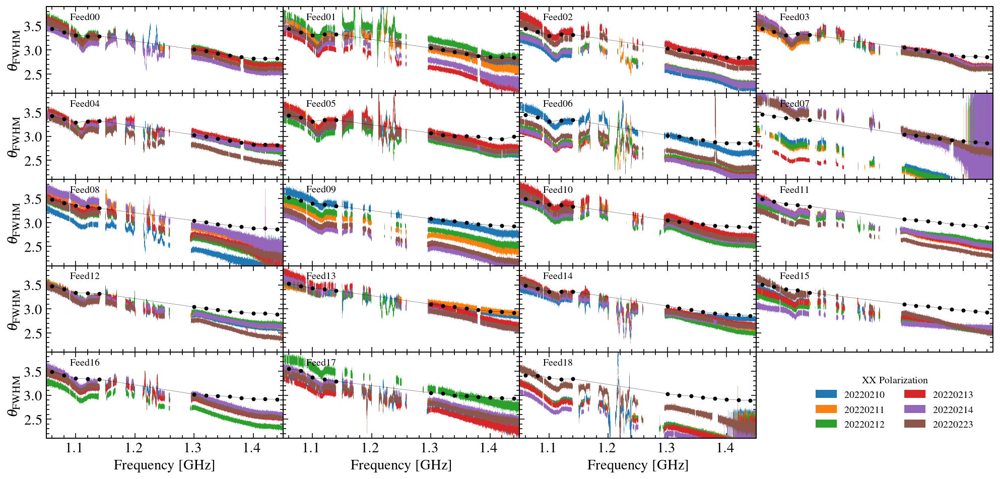

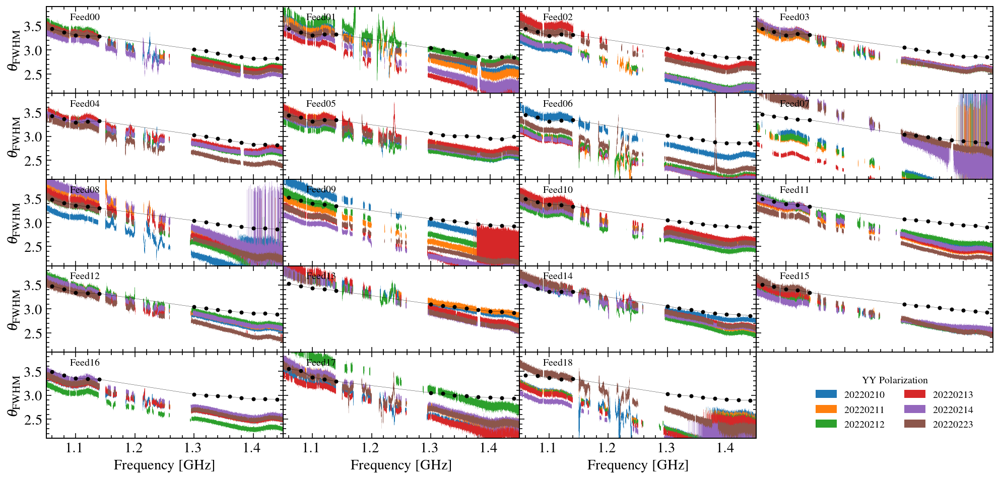

In [9]:
plot_cal.plot_fwhm_days(output_path, key_dict, beam_list, band_list=band_list, pol=0,
              fwhm_model=fwhm_file, output='./plot/fwhm_XX.png')
plot_cal.plot_fwhm_days(output_path, key_dict, beam_list, band_list=band_list, pol=1,
              fwhm_model=fwhm_file, output='./plot/fwhm_YY.png')

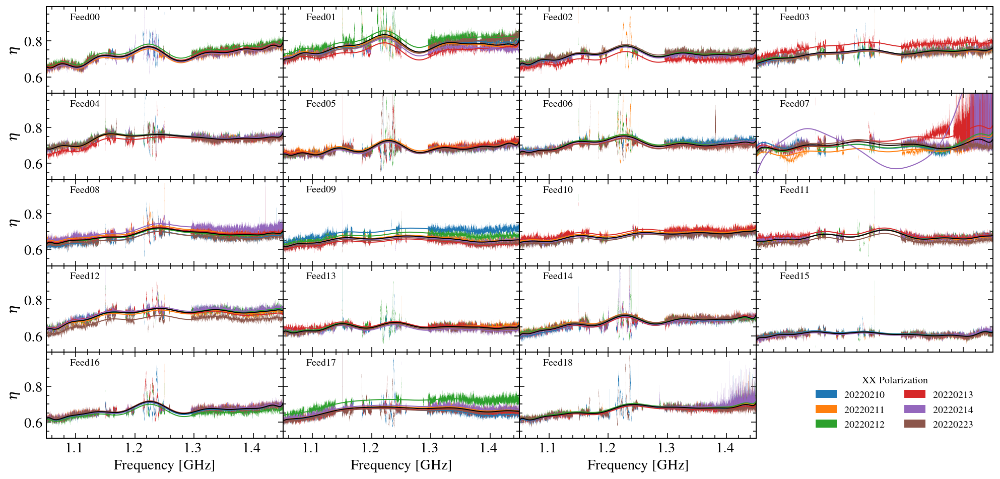

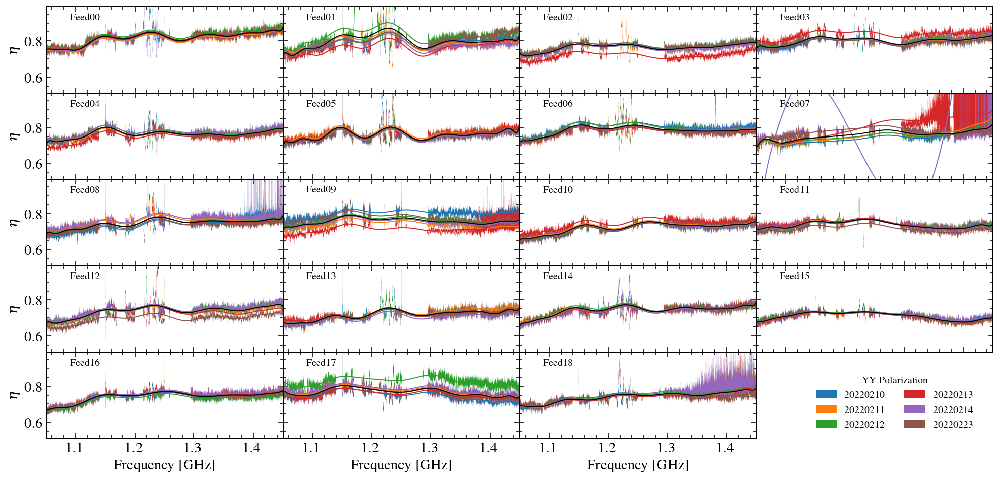

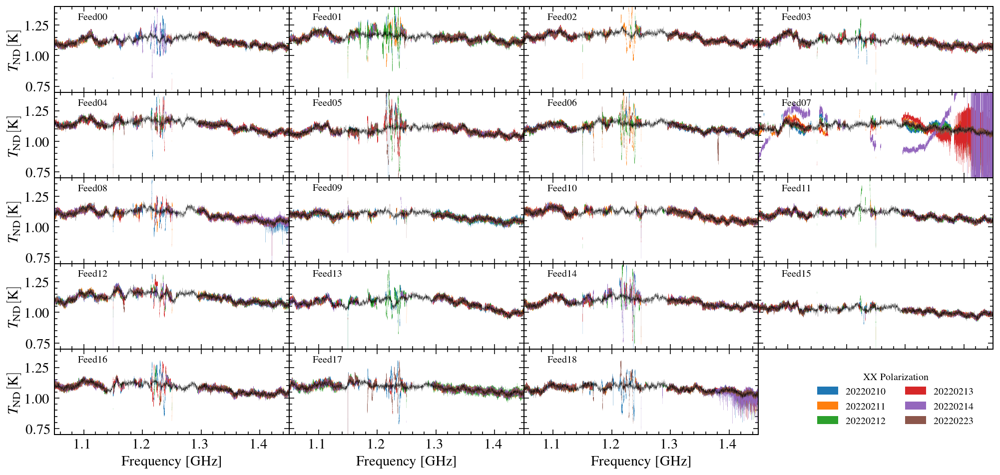

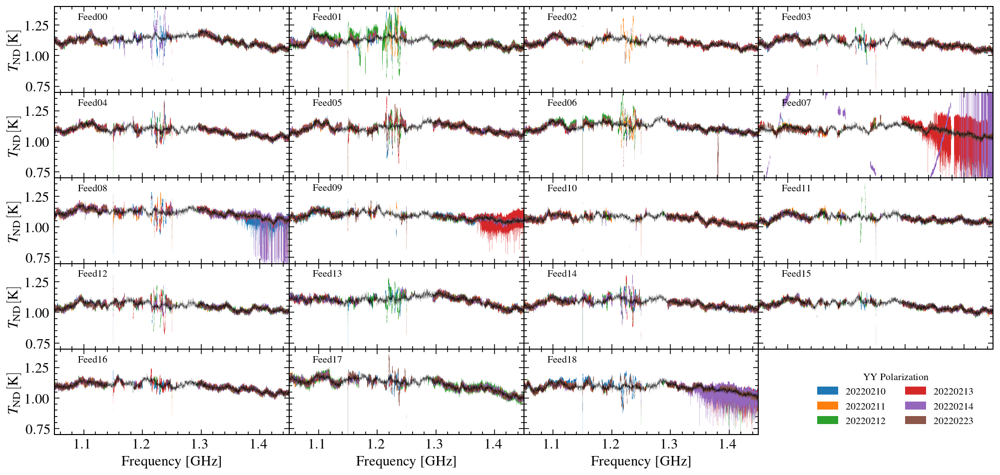

In [10]:
plot_cal.plot_eta_days(output_path, key_dict, beam_list, band_list=band_list, pol=0,
              tnoise_model=tnoise_file, output='./plot/eta_XX.png')
plot_cal.plot_eta_days(output_path, key_dict, beam_list, band_list=band_list, pol=1,
              tnoise_model=tnoise_file, output='./plot/eta_YY.png')

plot_cal.plot_Tnoise_days(output_path, key_dict, beam_list, band_list=band_list, pol=0,
                 tnoise_model=tnoise_file, output='./plot/Tnd_XX.png')
plot_cal.plot_Tnoise_days(output_path, key_dict, beam_list, band_list=band_list, pol=1,
                 tnoise_model=tnoise_file, output='./plot/Tnd_YY.png')

In [11]:
%reset -f array

{'20220215': ['3C286_026', '3C286_027', '3C286_028', '3C286_029', '3C286_030'], '20220216': ['3C286_031', '3C286_032', '3C286_033', '3C286_034', '3C286_035'], '20220218': ['3C286_041', '3C286_042', '3C286_043', '3C286_044', '3C286_045'], '20220219': ['3C286_046', '3C286_047', '3C286_048', '3C286_049', '3C286_050'], '20220220': ['3C286_051', '3C286_052', '3C286_053', '3C286_054', '3C286_055'], '20220221': ['3C286_056', '3C286_057', '3C286_058', '3C286_059', '3C286_060']}


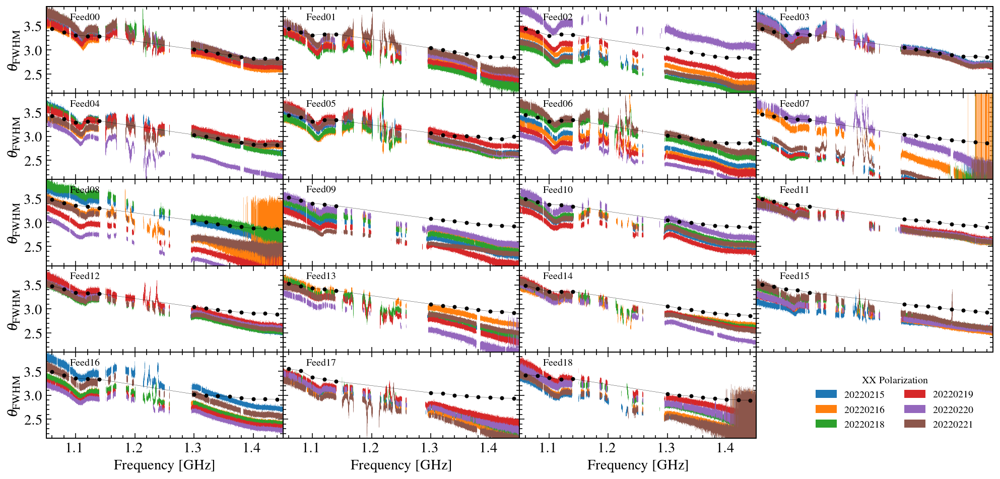

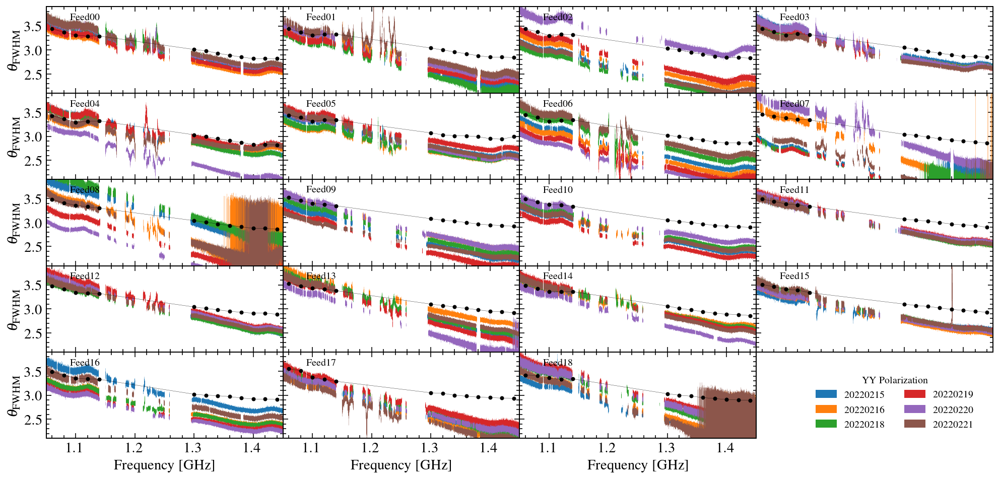

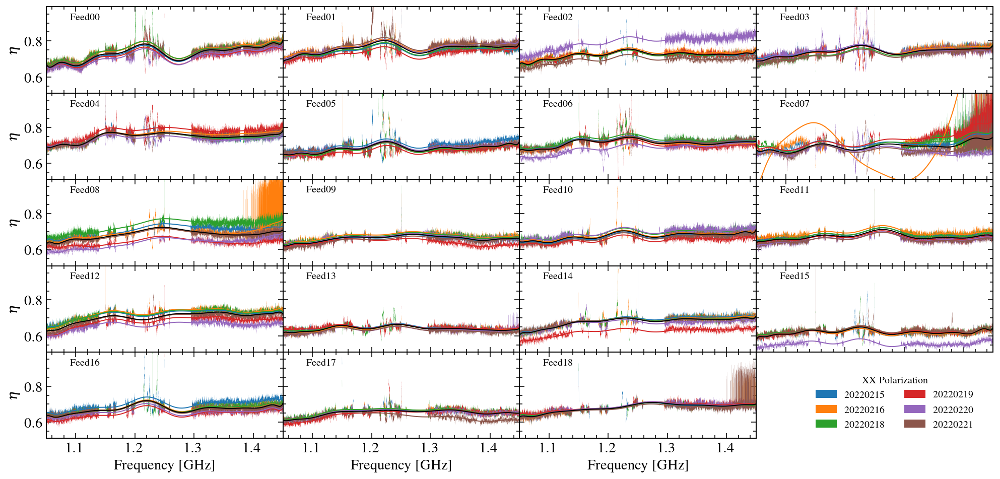

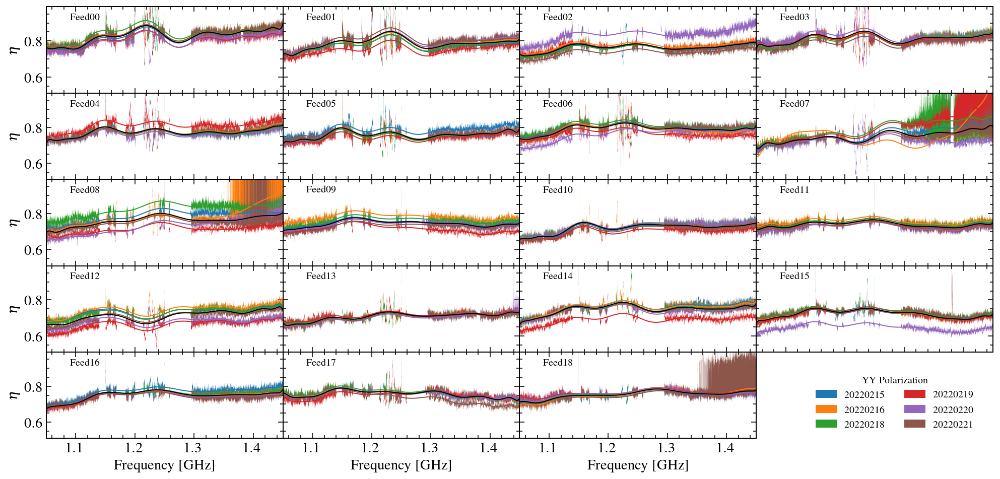

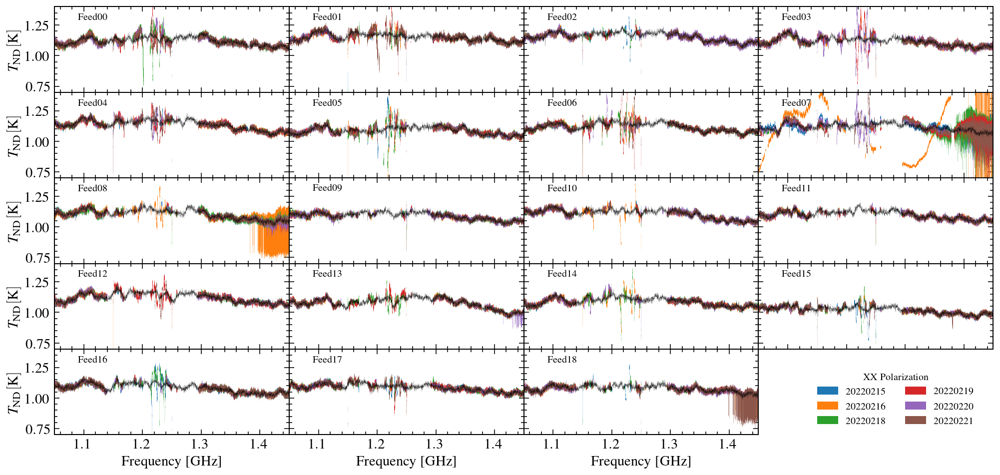

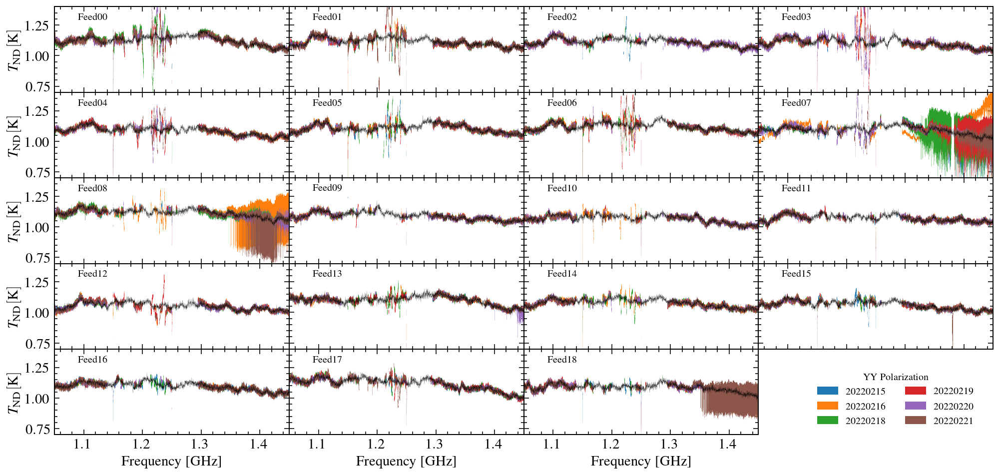

In [14]:
output_path = data_base + '/cal_3c286/'
key_dict = {}
for DATA_Key, DATA, DATE, cal_date in iter_data_key(DATA_Key_list[6:]):
    
    data_path = data_base + '/raw/calibration/%s/'%cal_date
    cal_keys = []
    for data_name in os.listdir(data_path):
        _name = data_name.split('.')[0]
        _name = _name.split('_')
        cal_keys.append('%s_%s'%(_name[0], _name[1]))
    cal_keys = list(set(cal_keys))
    cal_keys.sort()
    key_dict[cal_date] = cal_keys
print(key_dict)
plot_cal.plot_fwhm_days(output_path, key_dict, beam_list, band_list=band_list, pol=0,
              fwhm_model=fwhm_file, output='./plot/fwhm_XX.png')
plot_cal.plot_fwhm_days(output_path, key_dict, beam_list, band_list=band_list, pol=1,
              fwhm_model=fwhm_file, output='./plot/fwhm_YY.png')
plot_cal.plot_eta_days(output_path, key_dict, beam_list, band_list=band_list, pol=0,
              tnoise_model=tnoise_file, output='./plot/eta_XX.png')
plot_cal.plot_eta_days(output_path, key_dict, beam_list, band_list=band_list, pol=1,
              tnoise_model=tnoise_file, output='./plot/eta_YY.png')

plot_cal.plot_Tnoise_days(output_path, key_dict, beam_list, band_list=band_list, pol=0,
                 tnoise_model=tnoise_file, output='./plot/Tnd_XX.png')
plot_cal.plot_Tnoise_days(output_path, key_dict, beam_list, band_list=band_list, pol=1,
                 tnoise_model=tnoise_file, output='./plot/Tnd_YY.png')